># Notre projet
Le projet vise à générer automatiquement des activités et jeux interactifs en anglais par niveau grâce au traitement du langage naturel (NLP), afin d’aider les enfants à mieux apprendre et pratiquer la langue.







# I.Data pre-processing

1.Data cleaning.

2.Tokenization.

3.Lemmatization.

4.Part-of-speech tagging.

5.Name Entity Recognition (NER).


 # II.Data embaddings

 1.C BOW & Skip-gram

 2.BERT









---


---

># 1.Data cleaning

In [1]:
#Installation des bibliothèques nécessaires

!pip install spacy
#installer la bibliothèque spaCy, un puissant outil de traitement automatique du langage naturel (NLP).
!pip install nltk
#installer NLTK (Natural Language Toolkit), une autre bibliothèque NLP très utilisée pour le prétraitement linguistique.
!pip install unidecode
#installer Unidecode, une bibliothèque pour supprimer les accents et caractères spéciaux.
!pip install gensim
#installer Gensim, une bibliothèque spécialisée dans la modélisation sémantique et les représentations vectorielles de mots.
!pip install pandas
#installer Pandas, une bibliothèque pour la manipulation et l’analyse de données.

# Téléchargement de modèle anglais de spaCy pour POS , NER et Un vocabulaire et des embeddings de base.
!python -m spacy download en_core_web_sm
#c’est ce qui permet à spaCy de “comprendre” le texte anglais pour effectuer :
#L’analyse syntaxique
#La reconnaissance d’entités comme personnes, organisations, lieux
#La segmentation de phrases


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.1/62.1 kB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.6/16.6 MB 37.9 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 1.26.4
    Uninstalling numpy-1.26.4:
      Successfully uninstalled numpy-1.26.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
scipy 1.13.1 requires numpy<2.3,>=1.22.4, but you have numpy 2.3.4 which is incompatible.
gensim 4.3.3 requires numpy<2.0,>=1.18.5, but you have numpy 2.3.4 which is incompatible.
opencv-contrib-python 4.12.0.88 requires numpy<2.3.0,>=2; python_version >= "3.9", but you have numpy 2.3.4 which is incompatible.
tensorflow 2.19.0 requires numpy<2.2.0,>=1.26.0, but you have numpy 2.3.4 which is incompatible.
numba 0.60.0 requires numpy<2.1,>=1.22, but you have numpy 2.3.4 which is incompatible.
opencv-python 4.12.

  Using cached numpy-1.26.4-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (61 kB)
Using cached numpy-1.26.4-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (18.0 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 2.3.4
    Uninstalling numpy-2.3.4:
      Successfully uninstalled numpy-2.3.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
opencv-contrib-python 4.12.0.88 requires numpy<2.3.0,>=2; python_version >= "3.9", but you have numpy 1.26.4 which is incompatible.
thinc 8.3.6 requires numpy<3.0.0,>=2.0.0, but you have numpy 1.26.4 which is incompatible.
opencv-python 4.12.0.88 requires numpy<2.3.0,>=2; python_version >= "3.9", but you have numpy 1.26.4 which is incompatible.
opencv-python-headless 4.12.0.88 requires numpy<2.3.0,>=2; python_version >= "3.9", but you have numpy 1.26.4 which is incompatible

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 75.6 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


In [2]:
#L'importation de bibliothèqueses
import pandas as pd
import nltk
#outils linguistiques pour le prétraitement du texte.
#Tokenisation, stopwords, racinisation (stemming), etc.
from gensim.models import Word2Vec
#Apprendre des relations sémantiques entre mots.
#Calculer la similarité entre mots ou documents.
import spacy
#traitement linguistique avancé.
#(Tokenisation, POS tagging (nature du mot), NER (entités nommées), parsing syntaxique, etc.)
from spacy.tokenizer import Tokenizer
#importer le tokenizer de spaCy pour découper le texte en mots ou tokens.
from spacy import displacy
#Visualiser les relations syntaxiques ou les entités nommées dans une phrase.
from nltk.stem import PorterStemmer
#Réduire les mots à leur racine pour éviter les variations (“running”, “runs”, “ran” → “run”.)

# Téléchargement des stopwords anglais
nltk.download('stopwords')

# Chargement de modèle anglais de spaCy
nlp = spacy.load("en_core_web_sm")
#Ce modèle contient les règles et les données nécessaires pour analyser le texte (POS, NER, parsing, etc.).

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [3]:
#Chargement de dataset CSV
df = pd.read_csv("data.csv")
# les premières lignes
df.head()
#la colonne contenant le texte s'appelle 'content'

,pdf_name,content,clean_text
0,241303P00.pdf,Activate And Perform\nThird Year Secondary Edu...,Activate And Perform Third Year Secondary Educ...
1,241403P00.pdf,National Pedagogic CentreWriting Team \nJawi...,National Pedagogic CentreWriting Team Jawida B...
2,241203P00.pdf,Perform to learnPerform to learn\nSecond Year ...,Perform to learnPerform to learn Second Year S...
3,241104P00.pdf,REPUBLIC OF TUNISIA\nMinistry of Education\nPe...,REPUBLIC OF TUNISIA Ministry of Education Perf...


In [4]:
import re
#permet d’utiliser
#des expressions régulières pour rechercher, remplacer ou supprimer des motifs dans un texte.
import unidecode
#supprimer les accents et convertir les caractères spéciaux.
from nltk.corpus import stopwords
#Supprimer les mots fréquents sans signification (“the”, “is”, “and”…).
import string
#contient des listes utiles de caractères comme les lettres ou la ponctuation.


# Liste des stopwords anglais
stop_words = set(stopwords.words("english"))
#nupprime la doublon de la liste
def clean_text(text):

    if not isinstance(text, str):
      #Vérifie que l’entrée est bien une chaîne de caractères.
        return ""

    # === Nettoyage brut (accents, espaces, HTML, etc.) ===
    text = unidecode.unidecode(text)
    #Supprime les accents
    text = re.sub(r'<[^>]+>', '', text)
    #Supprime les balises HTML
    text = re.sub(r'[\.•·…]+', ' ', text)
    #Supprime les points, puces, ellipses
    text = re.sub(r'\d+', '', text)
    #Supprime les chiffres
    text = re.sub(r'[^A-Za-z\s]', ' ', text)
    #Supprime les caractères non alphabétiques
    text = text.translate(str.maketrans('', '', string.punctuation))
    #Supprime toute la ponctuation
    text = re.sub(r'\s+', ' ', text).strip()
    #Remplace les espaces multiples par un seul et enlève ceux du début/fin


    # === Mise en minuscules sauf acronymes ===
    words = []
    for w in text.split():
        if w.isupper() and len(w) > 1:   # ex: AI, COVID
            words.append(w)
        else:
            words.append(w.lower())
    text = " ".join(words)
#Met tout en minuscules sauf les acronymes (mots en majuscules comme AI, COVID).
#Cela évite de perdre le sens des sigles importants.


    # === Suppression des stopwords et mots courts ===
    words = [w for w in text.split() if w not in stop_words and len(w) > 1]
    text_cleaned = " ".join(words).replace("isnt", "is not")
    return text_cleaned

#Retirer les stopwords (mots inutiles comme “the”, “is”, “and”)
#Retirer les mots dune seule lettre (ex. “a”, “I”)
#Corriger une contraction spécifique : "isnt" → "is not"


# === Application au DataFrame ===
df['clean_text'] = df['content'].apply(clean_text)
df[['content', 'clean_text']].head()



,content,clean_text
0,Activate And Perform\nThird Year Secondary Edu...,activate perform third year secondary educatio...
1,National Pedagogic CentreWriting Team \nJawi...,national pedagogic centrewriting team jawida b...
2,Perform to learnPerform to learn\nSecond Year ...,perform learnperform learn second year seconda...
3,REPUBLIC OF TUNISIA\nMinistry of Education\nPe...,REPUBLIC OF TUNISIA ministry education perform...


># 2.Tokenization


*Analyse de la fréquence et distribution des tokens (Zipf law)

*La tokenisation



Analyse de la fréquence des tokens:   0%|          | 0/3 [00:00<?, ?it/s]

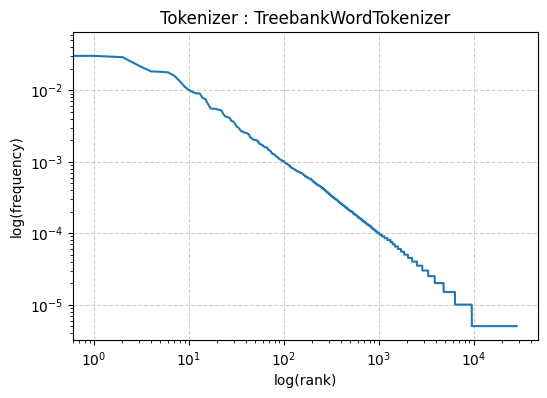

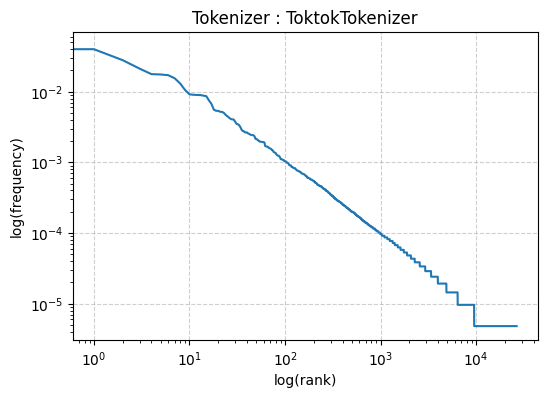

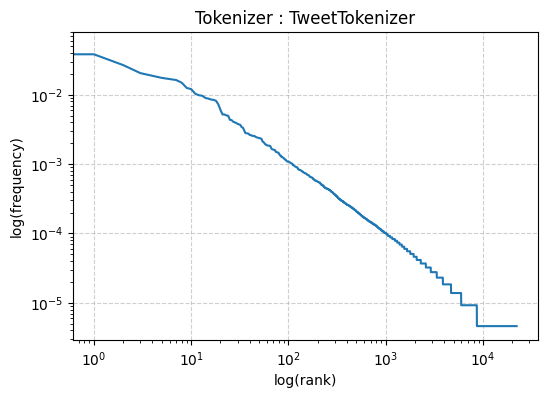

,content,clean_text,tokens
0,Activate And Perform\nThird Year Secondary Edu...,activate perform third year secondary educatio...,"[activate, perform, third, year, secondary, ed..."
1,National Pedagogic CentreWriting Team \nJawi...,national pedagogic centrewriting team jawida b...,"[national, pedagogic, centrewriting, team, jaw..."
2,Perform to learnPerform to learn\nSecond Year ...,perform learnperform learn second year seconda...,"[perform, learnperform, learn, second, year, s..."
3,REPUBLIC OF TUNISIA\nMinistry of Education\nPe...,REPUBLIC OF TUNISIA ministry education perform...,"[REPUBLIC, OF, TUNISIA, ministry, education, p..."


In [5]:


# Importation des tokenizers et librairies nécessaires
from nltk.tokenize import TreebankWordTokenizer, ToktokTokenizer, TweetTokenizer
#Tree Tokenizer basé sur les règles de Penn Treebank, adapté au texte formel.
#Tok Tokenizer simple et rapide, compatible avec les textes standards.
#tweet Tokenizer adapté aux tweets, gère les emojis, hashtags, mentions, URLs.
from tqdm.notebook import tqdm
#Barre de progression pour les boucles longues dans Jupyter Notebook.
from collections import Counter
#Compter les occurrences de chaque token.
import matplotlib.pyplot as plt
import pandas as pd
from nltk.tokenize import TreebankWordTokenizer

# Liste des tokenizers à comparer
tokenizers = [
    TreebankWordTokenizer(),
    ToktokTokenizer(),
    TweetTokenizer()
]
#exemple:
#“I’m happy :)”
#Treebank → ["I", "'m", "happy", ":" , ")"]
#Tweet → ["I", "'m", "happy", ":)"]


#  Analyse de la fréquence et distribution des tokens (Zipf law)

for tok in tqdm(tokenizers, desc="Analyse de la fréquence des tokens"):
    arr = df['content'].drop_duplicates().apply(lambda x: tok.tokenize(str(x))).array
    #df['content'].drop_duplicates() → on ignore les doublons pour l’analyse.
    arr = [token for tokens in arr for token in tokens]

    # Compter les occurrences
    c = Counter(arr)
    #crée un dictionnaire {token: nombre d'occurrences}.

    # Mise en DataFrame pour analyse
    #Convertit le dictionnaire en DataFrame pour trier et calculer la fréquence des tokens.
    d = pd.DataFrame(c.items(), columns=['word', 'occurrences'])
    nb_total = d['occurrences'].sum()
    d['freq'] = d['occurrences'] / nb_total
    #freq=fréquence du token dans le corpus.

    d = d.sort_values('freq', ascending=False)
    ##sort_values('freq', ascending=False) trier par fréquence décroissante.

    # Graphique log-log (loi de Zipf)
    plt.figure(figsize=(6,4))
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.xscale('log')
    plt.yscale('log')
    plt.xlabel('log(rank)')
    plt.ylabel('log(frequency)')
    ##axes en échelle logarithmique pour mieux voir la distribution.
    plt.title(f"Tokenizer : {tok.__class__.__name__}")
    #Chaque tokenizer aura un graphique pour comparer la segmentation et la distribution des tokens.
    plt.plot(range(len(d)), d['freq'])
    plt.show()
    #visualiser la loi de Zipf,
    #qui dit que la fréquence des mots diminue approximativement en fonction de leur rang.




# Initialisation de tokenizer
tokenizer = TreebankWordTokenizer()

# Application da tokenisation à chaque texte nettoyé
df['tokens'] = df['clean_text'].apply(lambda x: tokenizer.tokenize(x))
#Crée une nouvelle colonne tokens contenant la liste des tokens de chaque textes .

# Affichage  d'un aperçu avec les 3 colonnes principales
df[['content', 'clean_text', 'tokens']].head()



 ># 3.Lemmatisation

In [6]:

df['lemmas'] = df['clean_text'].apply(lambda x: [token.lemma_ for token in nlp(x)])
#token.pos → la catégorie grammaticale (nom, verbe, adjectif, etc.)
#C'est une compréhension de liste qui parcourt tous les tokens
#du texte et crée une liste contenant uniquement les lemmes.
 #--->Garde le sens
#exemple
#x = "Dogs are running in the park"
# ['dog', 'be', 'run', 'in', 'the', 'park']

df.head()


,pdf_name,content,clean_text,tokens,lemmas
0,241303P00.pdf,Activate And Perform\nThird Year Secondary Edu...,activate perform third year secondary educatio...,"[activate, perform, third, year, secondary, ed...","[activate, perform, third, year, secondary, ed..."
1,241403P00.pdf,National Pedagogic CentreWriting Team \nJawi...,national pedagogic centrewriting team jawida b...,"[national, pedagogic, centrewriting, team, jaw...","[national, pedagogic, centrewriting, team, jaw..."
2,241203P00.pdf,Perform to learnPerform to learn\nSecond Year ...,perform learnperform learn second year seconda...,"[perform, learnperform, learn, second, year, s...","[perform, learnperform, learn, second, year, s..."
3,241104P00.pdf,REPUBLIC OF TUNISIA\nMinistry of Education\nPe...,REPUBLIC OF TUNISIA ministry education perform...,"[REPUBLIC, OF, TUNISIA, ministry, education, p...","[REPUBLIC, of, TUNISIA, ministry, education, p..."


># 4.POS tagging

In [7]:
# Exemple sur les 5 premiers textes
for t in df['clean_text'].head():
    doc = nlp(t)
    #doc est un objet spaCy contenant tous les tokens du texte
    #ainsi que leurs attributs :token.text,token.pos_ ,token.lemma
    print(f"Text: {t}")
    print("POS tagging:", [(token.text, token.pos_) for token in doc])
    #Crée une liste de tuples (mot, étiquette grammaticale) pour chaque token du texte.
    #token.pos_ donne la catégorie grammaticale (nom, verbe, adjectif, adverbe, etc.).
    print("\n")

Text: activate perform third year secondary education student book authors abdennour KHEMIRI mohamed lamjed LABIDI inspector inspector aysha MEZZI hamida MENCHARI inspector teacher trainer evaluators jawida BEN AFIA mohamed fethi EL BEJI inspector general senior inspector national pedagogic centrerepublic OF TUNISIA MINISTRY OF EDUCATION acknowledgements authors would like express deep gratitude ms jawida BEN AFIA inspector general mr mohamed fethi EL BEJI senior inspector constructive evaluation vision patience help ongoing support insight step textbook writing process together everyone accomplishes rights reserved national pedagogic centrec preface activate perform textbook third year secondary education divided modules one review module six learning modules two consolidation modules addition modules book contains preface book map lists words covered module grammar summary list irregular verbs chart phoneticsymbols module book based different topic consists five common core sections 

># 5.Named Entity Recognition (NER)


In [8]:
# Visualisation des entités sur les 5 premiers textes
for t in df['clean_text'].head():
    doc = nlp(t)
    print(f"Text: {t}")
    print("Entities:", [(ent.text, ent.label_) for ent in doc.ents])
    #Parcourt toutes les entités détectées dans doc (doc.ents).
    #Crée une liste de tuples (ent.text, ent.label_) où :
    #ent.text → le texte de l’entité
    #ent.label_ → le type d’entité (PERSON, ORG, GPE, DATE, etc.)
    displacy.render(doc, style="ent", jupyter=True)
    #Visualiser les entités surlignées dans le notebook


Text: activate perform third year secondary education student book authors abdennour KHEMIRI mohamed lamjed LABIDI inspector inspector aysha MEZZI hamida MENCHARI inspector teacher trainer evaluators jawida BEN AFIA mohamed fethi EL BEJI inspector general senior inspector national pedagogic centrerepublic OF TUNISIA MINISTRY OF EDUCATION acknowledgements authors would like express deep gratitude ms jawida BEN AFIA inspector general mr mohamed fethi EL BEJI senior inspector constructive evaluation vision patience help ongoing support insight step textbook writing process together everyone accomplishes rights reserved national pedagogic centrec preface activate perform textbook third year secondary education divided modules one review module six learning modules two consolidation modules addition modules book contains preface book map lists words covered module grammar summary list irregular verbs chart phoneticsymbols module book based different topic consists five common core sections 

Text: national pedagogic centrewriting team jawida ben afia inspector general education fatma bechoual teacher rachid najar inspectorjameledine aichi teacher trainer evaluation team mohamed ben abdallah inspector abdennour khemiri inspectorrepublic OF TUNISIA MINISTRY OF EDUCATION rights reserved national pedagogic centre PREFACE skills life book students year secondary education addresses students various streams common core lessons withadditional material arts students covered two weekly extrahours labelled arts students book made introductory unit nine lesson units consolidation units checking year check language skills last section entitled ADD ONS including grammar reference ocabulary strategies irregular verbs word list units based four language skills developed integrated manner skills blend reflected use INTO lesson titles labelled speaking INTO reading listening INTO writing reading INTO writing speaking INTO listening skill integration takes students construction meaning list

Text: perform learnperform learn second year secondary education student book authors ezzeddine AMMAR hammed MERDESSI inspector inspector ali OMRANE medhabib RADDAOUI advisor senior teacher evaluators jaouida BEN AFIA abdennour KHEMIRI general inspector inspector national pedagogic centrerepublic OF TUNISIA MINISTRY OF EDUCATION authors acknowledgements deeply grateful people helped us materialize project indebted particular evaluation team ms jaouida ben AFIA general inspector mrabdennour KHEMIRI inspector made use many sources would impossible name forum magazine british american dailies magazines andinternet sites sources matter hard always tried adapt customize material still hope notinfringed anyone rights rights reserved national pedagogic centre preface PERFORM TO LEARN book second year secondary education based following key principles learner considered manager improvement capable taking learning process responsibility therefore encouraged todevelop autonomy critical thinking 

Text: REPUBLIC OF TUNISIA ministry education perform english first year secondary education pupil book beji mohamed fethi senior inspector ben abdallah mohamed senior inspector national pedagogic centre rights reserved national pedagogic centre perform english attempt implementing tunisian syllabus present provisional edition book meant betried assessed parties involved eventually amended basic assumptions underlying making book following learner role paramount main actor constructing meaning hence autonomy expected demonstrate learning learners immediate environment classroom viewed valid context communicating sharing learning matter give take involves hypothesising negotiating checking language seen means communication self others also presented subject matter requiring specific study skills strategies ultimate purpose learning language acquire skills enable learner construct meaning interact others hence important role given book authenticity language andactivities one hand context 



  # II.Data embaddings










> # 1. CBOW & Skip-gram

In [9]:
from gensim.models import Word2Vec
#Word2Vec (Gensim) : permet de créer des représentations vectorielles (embeddings)
#pour chaque mot du corpus.
import numpy as np


# Préparation de corpus tokenisé
tokenized_corpus = df['tokens'].tolist()
#convertit la colonne en liste de listes, adaptée à l’entrée de Word2Vec.

#Apprendre embeddings des mots
# 1.CBOW
#(Continuous Bag of Words)prédit le mot cible à partir du contexte
w2v_cbow = Word2Vec(
    sentences=tokenized_corpus,
    #corpus d’entraînement.
    vector_size=100,
    #dimension du vecteur pour chaque mot.
    window=5,
    #taille du contexte autour du mot cible.
    min_count=1,
    #ignorer les mots apparaissant moins d’une fois.
    sg=0,       # CBOW
    workers=4
    #workers=4 → nombre de threads pour l’entraînement.
)


#2.Skip-gram
#le modèle prédit les mots du contexte à partir du mot cible.
w2v_skipgram = Word2Vec(
    sentences=tokenized_corpus,
    vector_size=100,
    window=5,
    min_count=1,
    sg=1,       # Skip-gram
    workers=4
)


def vectorize_text(tokens, model):
    vectors = [model.wv[word] for word in tokens if word in model.wv]
    if len(vectors) == 0:
        return np.zeros(model.vector_size)
    return np.mean(vectors, axis=0)
#Parcourt chaque mot du texte (tokens)
#et récupère son embedding (model.wv[word]) si présent dans le vocabulaire.
#np.mean calcule la moyenne des vecteurs des mots pour obtenir un embedding unique du texte.


# Appliquer la vectorisation
df['vector_cbow'] = df['tokens'].apply(lambda x: vectorize_text(x, w2v_cbow))
df['vector_skipgram'] = df['tokens'].apply(lambda x: vectorize_text(x, w2v_skipgram))

# --- Affichage des résultats ---
print(" Vectorisation terminée avec succès !\n")

print("Exemple de vecteurs :\n")
print("CBOW :", df['vector_cbow'].iloc[0][:10], "...")  # afficher 10 premières valeurs
print("Skip-gram :", df['vector_skipgram'].iloc[0][:10], "...\n")

print(" Dimensions des vecteurs :")
print("CBOW :", len(df['vector_cbow'].iloc[0]))
print("Skip-gram :", len(df['vector_skipgram'].iloc[0]))

# --- Aperçu du DataFrame avec les nouvelles colonnes ---
df[['content', 'tokens', 'vector_cbow', 'vector_skipgram']].head()


 Vectorisation terminée avec succès !

Exemple de vecteurs :

CBOW : [-0.00529528  0.00921299  0.00986878  0.00284335  0.00574503 -0.02134007
  0.00723014  0.02883904 -0.01225497 -0.0041326 ] ...
Skip-gram : [-0.11168951  0.12090151  0.16013929 -0.04472383  0.01680524 -0.23781784
  0.16658548  0.47561884 -0.01504577 -0.00071838] ...

 Dimensions des vecteurs :
CBOW : 100
Skip-gram : 100


,content,tokens,vector_cbow,vector_skipgram
0,Activate And Perform\nThird Year Secondary Edu...,"[activate, perform, third, year, secondary, ed...","[-0.0052952846, 0.00921299, 0.0098687755, 0.00...","[-0.11168951, 0.12090151, 0.16013929, -0.04472..."
1,National Pedagogic CentreWriting Team \nJawi...,"[national, pedagogic, centrewriting, team, jaw...","[-0.0047168992, 0.008170527, 0.00871407, 0.002...","[-0.10026508, 0.10896909, 0.14407519, -0.03948..."
2,Perform to learnPerform to learn\nSecond Year ...,"[perform, learnperform, learn, second, year, s...","[-0.005459599, 0.009590094, 0.010307443, 0.002...","[-0.112972446, 0.12314403, 0.16653873, -0.0455..."
3,REPUBLIC OF TUNISIA\nMinistry of Education\nPe...,"[REPUBLIC, OF, TUNISIA, ministry, education, p...","[-0.005701397, 0.009693818, 0.010470679, 0.003...","[-0.116922714, 0.12503402, 0.16105717, -0.0459..."


> # 2. BERT


Bidirectional Encoder Representations from Transformers) est un modèle de langage développé par Google en 2018.
C’est une révolution en NLP (Natural Language Processing) car il comprend le contexte complet d’un mot, en regardant à la fois à gauche et à droite dans la phrase — d’où le terme "bidirectionnel".

In [10]:
!pip install transformers torch --quiet
#transformers : contient les modèles pré-entraînés comme BERT.
#torch : framework de deep learning utilisé pour manipuler les tenseurs et exécuter les modèles.
#--quiet : rend l’installation moins verbeuse, affichant uniquement les messages essentiels.


Dans ce code, nous utilisons BERT, un modèle de langage pré-entraîné puissant, pour transformer nos textes en vecteurs numériques.

Tout d’abord, nous installons et importons les bibliothèques nécessaires (transformers et torch).
Ensuite, nous chargeons le tokenizer et le modèle BERT pré-entraîné bert-base-uncased.

La fonction bert_vectorize prend un texte, le convertit en tokens compréhensibles par BERT, et génère les embeddings de la dernière couche.
Nous faisons la moyenne de ces embeddings pour obtenir un vecteur unique représentant le texte.

Enfin, nous appliquons cette fonction à notre DataFrame, ce qui permet de stocker pour chaque texte son vecteur BERT exploitable pour des tâches comme la classification, la recherche sémantique ou l’analyse de similarité.
Cette approche permet de capturer le sens profond du texte, contrairement aux méthodes traditionnelles basées sur les mots seuls.



In [11]:
from transformers import BertTokenizer, BertModel
#BertTokenizer : sert à convertir le texte en tokens compréhensibles par BERT (transforme les mots en nombres).
#BertModel : charge le modèle BERT pré-entraîné pour générer des embeddings/contextes.
import torch

# Charger le modèle et le tokenizer BERT
bert_tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
#Charge le tokenizer BERT pré-entraîné (bert-base-uncased).
#"uncased" = le texte sera mis en minuscules avant tokenisation.
#Ce tokenizer va transformer chaque texte en séquence de nombres que BERT peut comprendre.
bert_model = BertModel.from_pretrained('bert-base-uncased')
#harge le modèle BERT pré-entraîné (bert-base-uncased).
#Ce modèle est capable de transformer une séquence de tokens en vecteurs denses (embeddings) capturant le sens du texte.

# Fonction de vectorisation avec BERT
def bert_vectorize(text):

    inputs = bert_tokenizer(text, return_tensors='pt', truncation=True, padding=True, max_length=128)
#okenise le texte et le convertit en tenseur PyTorch (pt).

#truncation=True : coupe le texte si trop long.

#padding=True : ajoute des zéros pour uniformiser la longueur des séquences.

#max_length=128 : longueur maximale des séquences.
    with torch.no_grad():
        outputs = bert_model(**inputs)
#Passe le texte dans BERT pour obtenir les embeddings.
#torch.no_grad() : désactive la rétropropagation (pas d’entraînement, juste inférence

    # On prend la moyenne des embeddings de la dernière couche cachée
    embeddings = outputs.last_hidden_state.mean(dim=1).squeeze().numpy()
#outputs.last_hidden_state : vecteurs de chaque token de la dernière couche de BERT.

#mean(dim=1) : moyenne des vecteurs pour obtenir un vecteur unique pour tout le texte.

#squeeze() : supprime les dimensions inutiles.

#numpy() : convertit le tenseur PyTorch en tableau NumPy exploitable par d’autres modèles ML.


    return embeddings

# Appliquer BERT sur quelques textes (c’est lent)
df['vector_bert'] = df['clean_text'].apply(lambda x: bert_vectorize(x))

print("Exemple de vecteur BERT :\n")
print("BERT :", df['vector_bert'].iloc[0][:10], "...")  # afficher les 10 premières valeurs

print("\n Dimension du vecteur BERT :", len(df['vector_bert'].iloc[0]))

print("\n--- Aperçu du DataFrame ---")
print(df[['clean_text', 'vector_bert']].head())

# --- Aperçu final du DataFrame ---
print("\n--- Aperçu du DataFrame avec les nouvelles colonnes ---")
df[['content', 'tokens', 'vector_cbow', 'vector_skipgram', 'vector_bert']].head()


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

Exemple de vecteur BERT :

BERT : [-0.1272173   0.45588738  0.19575989 -0.25955203  0.16755453 -0.35829747
  0.13179325  0.13747059  0.07508306 -0.11169454] ...

 Dimension du vecteur BERT : 768

--- Aperçu du DataFrame ---
                                          clean_text  \
0  activate perform third year secondary educatio...   
1  national pedagogic centrewriting team jawida b...   
2  perform learnperform learn second year seconda...   
3  REPUBLIC OF TUNISIA ministry education perform...   

                                         vector_bert  
0  [-0.1272173, 0.45588738, 0.19575989, -0.259552...  
1  [-0.033852264, 0.38844433, 0.13754609, -0.1957...  
2  [-0.077006064, 0.43595704, 0.0889251, -0.17781...  
3  [-0.017516423, 0.24985138, 0.276538, -0.186479...  

--- Aperçu du DataFrame avec les nouvelles colonnes ---


,content,tokens,vector_cbow,vector_skipgram,vector_bert
0,Activate And Perform\nThird Year Secondary Edu...,"[activate, perform, third, year, secondary, ed...","[-0.0052952846, 0.00921299, 0.0098687755, 0.00...","[-0.11168951, 0.12090151, 0.16013929, -0.04472...","[-0.1272173, 0.45588738, 0.19575989, -0.259552..."
1,National Pedagogic CentreWriting Team \nJawi...,"[national, pedagogic, centrewriting, team, jaw...","[-0.0047168992, 0.008170527, 0.00871407, 0.002...","[-0.10026508, 0.10896909, 0.14407519, -0.03948...","[-0.033852264, 0.38844433, 0.13754609, -0.1957..."
2,Perform to learnPerform to learn\nSecond Year ...,"[perform, learnperform, learn, second, year, s...","[-0.005459599, 0.009590094, 0.010307443, 0.002...","[-0.112972446, 0.12314403, 0.16653873, -0.0455...","[-0.077006064, 0.43595704, 0.0889251, -0.17781..."
3,REPUBLIC OF TUNISIA\nMinistry of Education\nPe...,"[REPUBLIC, OF, TUNISIA, ministry, education, p...","[-0.005701397, 0.009693818, 0.010470679, 0.003...","[-0.116922714, 0.12503402, 0.16105717, -0.0459...","[-0.017516423, 0.24985138, 0.276538, -0.186479..."


Similarité CBOW (doctor-nurse) : 0.4544
Similarité Skip-gram (doctor-nurse) : 0.9979
Similarité BERT (doctor-nurse) : 0.9088


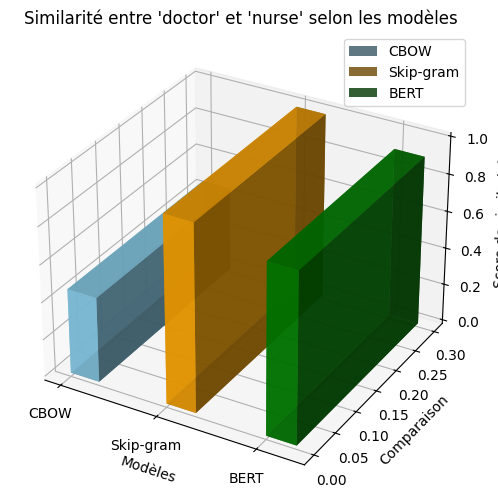

In [12]:
#comparer la similarité entre mots
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
# Mots à comparer
word1, word2 = "doctor", "nurse"
#On choisit ici deux mots pour mesurer leur similarité sémantique.
#Exemple : “doctor” et “nurse” sont proches en contexte médical.

# --- Similarité CBOW ---
sim_cbow = w2v_cbow.wv.similarity(word1, word2)
#2v_cbow : modèle Word2Vec entraîné avec l’algorithme CBOW (Continuous Bag of Words).
#similarity(word1, word2) : calcule la similarité cosinus entre les vecteurs de word1 et word2.
#Permet de mesurer à quel point deux mots apparaissent dans des contextes similaires.


# --- Similarité Skip-gram ---
sim_skip = w2v_skipgram.wv.similarity(word1, word2)
#w2v_skipgram : modèle Word2Vec entraîné avec l’algorithme Skip-gram.
#Différence avec CBOW : Skip-gram prédit le contexte à partir d’un mot cible.
#La fonction similarity retourne également la similarité cosinus, mais basée sur Skip-gram.



# --- Similarité BERT ---
from transformers import BertTokenizer, BertModel
import torch
import torch.nn.functional as F
#transformers : pour charger le modèle BERT et son tokenizer.
#torch : pour manipuler les tenseurs.
#torch.nn.functional : contient des fonctions comme cosine_similarity pour calculer la similarité entre vecteurs.


# Charger BERT
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
model = BertModel.from_pretrained('bert-base-uncased')
model.eval()
#tokenizer : transforme le mot en tokens que BERT peut comprendre.
#model : BERT pré-entraîné pour générer les vecteurs.
#model.eval() : met BERT en mode inférence (pas d’entraînement, économise la mémoire).

def get_bert_vector(word):
    """Retourne le vecteur moyen du mot avec BERT (moyenne des sous-tokens)."""
    inputs = tokenizer(word, return_tensors='pt')
    with torch.no_grad():
        outputs = model(**inputs)
    return outputs.last_hidden_state.mean(dim=1).squeeze()

    #Tokenise le mot et le passe dans BERT.
#last_hidden_state : vecteurs pour chaque token (BERT peut découper un mot en sous-tokens).
#mean(dim=1) : moyenne pour obtenir un vecteur unique pour le mot.
#squeeze() : supprime les dimensions inutiles, résultat prêt pour calculer la similarité.

# Obtenir les vecteurs des deux mots
vec1 = get_bert_vector(word1)
vec2 = get_bert_vector(word2)
# Calculer la similarité cosinus
#Chaque mot est transformé en vecteur dense BERT, capturant le sens du mot.

sim_bert = F.cosine_similarity(vec1, vec2, dim=0).item()
#Mesure la proximité sémantique entre vec1 et vec2.
#Résultat : un score entre -1 et 1 (1 = très similaire, 0 = indépendant).

# --- Affichage des résultats ---
print(f"Similarité CBOW ({word1}-{word2}) : {sim_cbow:.4f}")
print(f"Similarité Skip-gram ({word1}-{word2}) : {sim_skip:.4f}")
print(f"Similarité BERT ({word1}-{word2}) : {sim_bert:.4f}")


#Organisation des données pour la visualisation____________________________________________________________________________
models = ['CBOW', 'Skip-gram', 'BERT']
similarities = [sim_cbow, sim_skip, sim_bert]

# Création du graphique 3D
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

# Positions pour chaque barre
x = np.arange(len(models))
y = np.zeros_like(x)
z = np.zeros_like(x)
dx = np.ones_like(x) * 0.3
dy = np.ones_like(x) * 0.3
dz = similarities

# Couleurs pour chaque modèle
colors = ['skyblue', 'orange', 'green']

# Création des barres 3D
for i in range(len(models)):
    ax.bar3d(x[i], y[i], z[i], dx[i], dy[i], dz[i],
             color=colors[i], alpha=0.8, label=models[i])


#Personnalisation du graphique

ax.set_xticks(x)
ax.set_xticklabels(models)
ax.set_xlabel('Modèles')
ax.set_ylabel('Comparaison')
ax.set_zlabel('Score de similarité')
ax.set_title(f"Similarité entre '{word1}' et '{word2}' selon les modèles")

# Afficher la légende
ax.legend()

# Afficher le graphique
plt.show()

Ce code compare la similarité entre deux mots, ici “doctor” et “nurse”, en utilisant trois approches : CBOW, Skip-gram et BERT.

Pour CBOW et Skip-gram, on utilise des modèles Word2Vec pré-entraînés qui mesurent la proximité des mots selon leur contexte dans le corpus.
Pour BERT, nous transformons chaque mot en vecteur dense en tenant compte du contexte global grâce à la dernière couche du modèle, puis nous calculons la similarité cosinus entre ces vecteurs.

Enfin, nous affichons les scores de similarité, ce qui nous permet de comparer comment chaque modèle capture les relations sémantiques entre les mots.

In [13]:
#Comparaison de la taille des vecteurs
#Vérifier la dimension des vecteurs générés par chaque modèle (CBOW, Skip-gram, BERT).
#Important pour savoir la quantité d’informations capturées et pour adapter les modèles ML qui utilisent ces vecteurs.
print("CBOW vector size:", len(df['vector_cbow'].iloc[0]))
#df['vector_cbow'].iloc[0] : prend le premier vecteur CBOW dans ton DataFrame.
#len(...) : calcule la dimension du vecteur (nombre de valeurs dans le vecteur).

#Utilité : savoir combien de composantes le vecteur CBOW a (souvent 100 ou 300 selon l’entraînement).

print("Skip-gram vector size:", len(df['vector_skipgram'].iloc[0]))
print("BERT vector size:", len(df['vector_bert'].iloc[0]))
#Dimension plus grande = plus de capacité pour représenter le sens profond des mots et du texte.


CBOW vector size: 100
Skip-gram vector size: 100
BERT vector size: 768


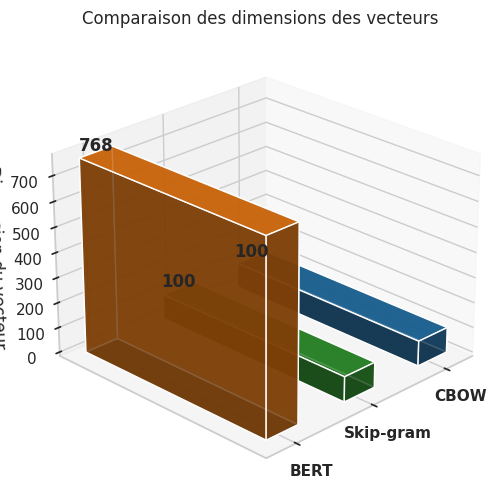

In [53]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

# Dimensions des vecteurs
sizes = [len(df['vector_cbow'].iloc[0]),
         len(df['vector_skipgram'].iloc[0]),
         len(df['vector_bert'].iloc[0])]
models = ['CBOW', 'Skip-gram', 'BERT']

# Coordonnées des barres
x = np.arange(len(models))
dx = dy = 0.4
dz = sizes
colors = ['#1f77b4', '#2ca02c', '#ff7f0e']

# Création de la figure 3D
fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(111, projection='3d')
ax.bar3d(x, np.zeros(len(x)), np.zeros(len(x)), dx, dy, dz, color=colors, alpha=0.8)

# Ajouter les valeurs au sommet
for xi, zi in zip(x, dz):
    ax.text(xi + dx/2, 0, zi + 5, str(zi), ha='center', fontweight='bold')

# Axes et titre
ax.set_xticks(x + dx/2)
ax.set_xticklabels(models, fontweight='bold')
ax.set_yticks([])
ax.set_zlabel("Dimension du vecteur")
ax.set_title("Comparaison des dimensions des vecteurs")

# Rotation initiale
ax.view_init(elev=25, azim=45)
plt.show()

Ce code compare la taille des vecteurs générés par trois modèles : CBOW, Skip-gram et BERT.

Pour CBOW et Skip-gram, la dimension des vecteurs dépend de l’entraînement Word2Vec, souvent 100 ou 300.
Pour BERT, la taille est beaucoup plus grande (souvent 768), car il capture un contexte sémantique plus riche et profond.

Cette comparaison nous permet de comprendre la complexité et la richesse de l’information que chaque modèle encode pour représenter les textes ou les mots. »